In [1]:
# importing all the necsessary libraries
import pandas as pd
import os
import numpy as np
import seaborn as sns 
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,ConfusionMatrixDisplay,classification_report

2024-01-21 15:48:57.894083: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Image Directory 

defective_images="/Users/ejbeazleigh/Desktop/Digital images of defective and good condition tyres/defective"
good_images="/Users/ejbeazleigh/Desktop/Digital images of defective and good condition tyres/good"

In [3]:
# See the number of files in each corresponding Image Directory
defective_files= os.listdir(defective_images)
defective_files=len(defective_files)
print(f"No. of Defective Tyres images:{defective_files}")

good_files= os.listdir(good_images)
good_files=len(good_files)
print(f"No. of Good Tyres images:{good_files}")

No. of Defective Tyres images:1028
No. of Good Tyres images:828


In [ ]:
######################### Data Visualisation ###############################

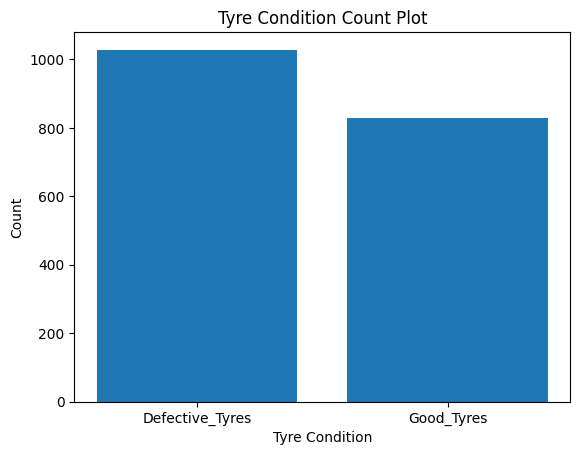

In [4]:
# lets visualise the above numeric data
data = [defective_files, good_files]
keys = ["Defective_Tyres", "Good_Tyres"]

plt.bar(keys,data)
plt.xlabel("Tyre Condition")
plt.ylabel("Count")
plt.title("Tyre Condition Count Plot")
plt.show()

In [5]:
######################## Dividing Datasets ##############################

image_directory="/Users/ejbeazleigh/Desktop/Digital images of defective and good condition tyres"
batch_size=32
img_width=224
img_height=224


train_data = tf.keras.utils.image_dataset_from_directory(image_directory, validation_split=0.2,seed=123,
subset="training",image_size=(img_height, img_width),batch_size=batch_size)

val_data = tf.keras.utils.image_dataset_from_directory(image_directory,validation_split=0.2, seed=123,
subset="validation",image_size=(img_height, img_width),batch_size=batch_size)


Found 1601 files belonging to 2 classes.
Using 1281 files for training.
Found 1601 files belonging to 2 classes.
Using 320 files for validation.


In [6]:
# Printing and defining the class names
class_names=train_data.class_names
print(class_names)

for image, label in train_data.take(1):
    print(f"Shape of Images with batch_size:{image.shape}")
    print("----------------------------------------------------------")
    print(f"Total no. of labels contain in one batch:{label.shape}")
    print("----------------------------------------------------------")
    print(f"Check the single image in form of tensors:{image[0]}")
    print("------------------------------------------------------------")
    print(f"Check the label of same image:{class_names[label[0]]}")

['defective', 'good']


2024-01-21 15:49:54.658226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1281]
	 [[{{node Placeholder/_4}}]]
2024-01-21 15:49:54.660670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1281]
	 [[{{node Placeholder/_4}}]]


Shape of Images with batch_size:(32, 224, 224, 3)
----------------------------------------------------------
Total no. of labels contain in one batch:(32,)
----------------------------------------------------------
Check the single image in form of tensors:[[[ 88.28931   88.28931   96.28931 ]
  [ 94.703125  94.703125 102.842285]
  [ 91.27466   91.27466  101.27466 ]
  ...
  [ 92.65625   88.65625   88.      ]
  [ 94.688965  90.688965  90.282715]
  [ 92.88257   88.88257   86.35132 ]]

 [[ 90.491455  90.78833   97.897705]
  [ 93.703125  93.911865 101.285645]
  [ 88.46875   88.46875   97.6333  ]
  ...
  [ 95.0979    91.0979    90.0979  ]
  [ 96.80249   92.80249   91.80249 ]
  [ 94.696045  90.696045  88.025635]]

 [[ 92.8125    92.94409  100.54932 ]
  [ 86.476074  87.42505   92.578125]
  [ 93.97046   93.97046  101.97046 ]
  ...
  [ 94.02954   90.02954   87.02954 ]
  [ 98.051025  94.051025  91.153076]
  [ 95.59375   91.59375   88.59375 ]]

 ...

 [[ 80.87256   83.5354    88.23193 ]
  [ 79.168

2024-01-21 15:50:35.582797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1281]
	 [[{{node Placeholder/_4}}]]
2024-01-21 15:50:35.583943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1281]
	 [[{{node Placeholder/_4}}]]


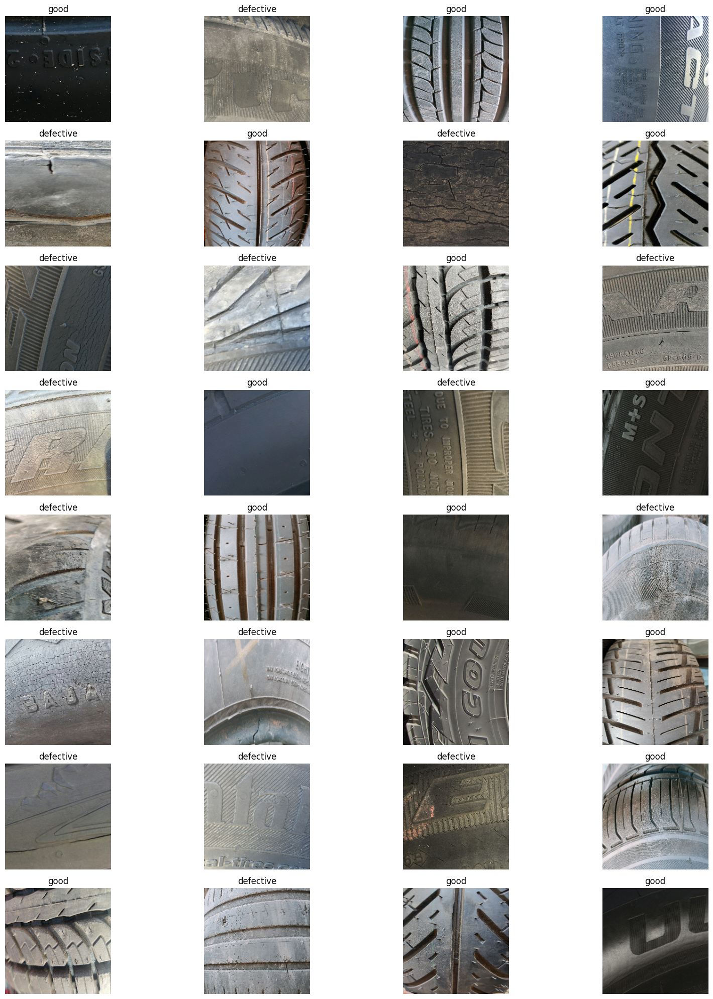

In [7]:
# Plotting the images
plt.figure(figsize=(20,20), tight_layout=True, facecolor="white")
for image, label in train_data.take(1):
    for i in range(32):
        ax=plt.subplot(8, 4, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        plt.title(class_names[label[i]])
        plt.axis("off")

In [19]:
# Define hyperparameters
learning_rate = 0.001
batch_size = 32
epochs = 10
dropout_rate = 0.5
dense_units = 512

# Create base model with tf.keras.applications
base_model = tf.keras.applications.resnet.ResNet50(include_top=False)

# Freeze the base model (so the pre-learned patterns remain the same)
base_model.trainable = False

# Create inputs into the base model
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model(inputs)

# Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)

x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(dense_units, activation="relu")(x)
x = tf.keras.layers.Dropout(dropout_rate)(x)  # Add dropout layer

# Create the output activation layer
outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# Combine the inputs with the outputs into a model
model = tf.keras.Model(inputs, outputs, name="model")

# Compile the model with hyperparameters
model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),  # Use learning_rate
              metrics=["accuracy"])

# Callbacks
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", patience=2, factor=0.5, min_lr=0.00001, verbose=1)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)

# Fit the model with hyperparameters
updatedmodel = model.fit(train_data, epochs=epochs, batch_size=batch_size, validation_data=val_data,
                    callbacks=[early_stopping, learning_rate_reduction], verbose=1)


Epoch 1/10
41/41 [==============================] - 205s 5s/step - loss: 0.5778 - accuracy: 0.8220 - val_loss: 0.2157 - val_accuracy: 0.9219 - lr: 0.0010
Epoch 2/10
41/41 [==============================] - 1072s 27s/step - loss: 0.2252 - accuracy: 0.9024 - val_loss: 0.1790 - val_accuracy: 0.9406 - lr: 0.0010
Epoch 3/10
41/41 [==============================] - 245s 6s/step - loss: 0.1292 - accuracy: 0.9477 - val_loss: 0.1498 - val_accuracy: 0.9438 - lr: 0.0010
Epoch 4/10
41/41 [==============================] - 239s 6s/step - loss: 0.1027 - accuracy: 0.9617 - val_loss: 0.1408 - val_accuracy: 0.9406 - lr: 0.0010
Epoch 5/10
41/41 [==============================] - 441s 5s/step - loss: 0.1045 - accuracy: 0.9539 - val_loss: 0.3077 - val_accuracy: 0.8844 - lr: 0.0010
Epoch 6/10
41/41 [==============================] - ETA: 0s - loss: 0.0716 - accuracy: 0.9727
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
41/41 [==============================] - 207s 5s/step - lo

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, None, None, 2048)  23587712  
                                                                 
 global_average_pooling_laye  (None, 2048)             0         
 r (GlobalAveragePooling2D)                                      
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               1049088   
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                             

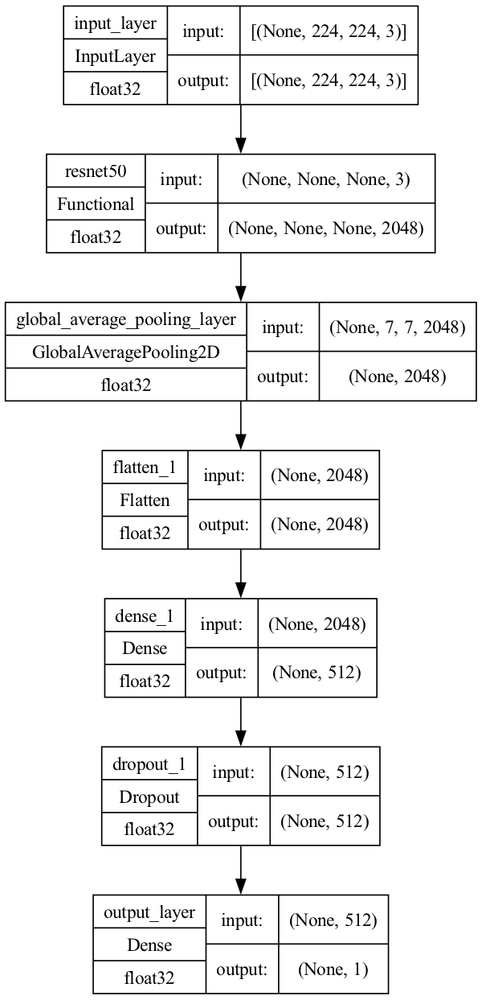

In [21]:

model.summary()

##################################


tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True, show_dtype=True, dpi=120)

In [22]:
dataframe=pd.DataFrame(updatedmodel.history)
dataframe

,loss,accuracy,val_loss,val_accuracy,lr
0,0.577807,0.822014,0.215744,0.921875,0.0010
1,0.225203,0.902420,0.178976,0.940625,0.0010
2,0.129233,0.947697,0.149842,0.943750,0.0010
3,0.102728,0.961749,0.140817,0.940625,0.0010
4,0.104472,0.953942,0.307706,0.884375,0.0010
5,0.071585,0.972678,0.163517,0.934375,0.0010
6,0.039380,0.986729,0.137732,0.934375,0.0005
7,0.030208,0.994536,0.113787,0.953125,0.0005
8,0.025245,0.993755,0.120718,0.937500,0.0005
9,0.018746,0.996097,0.105793,0.950000,0.0005


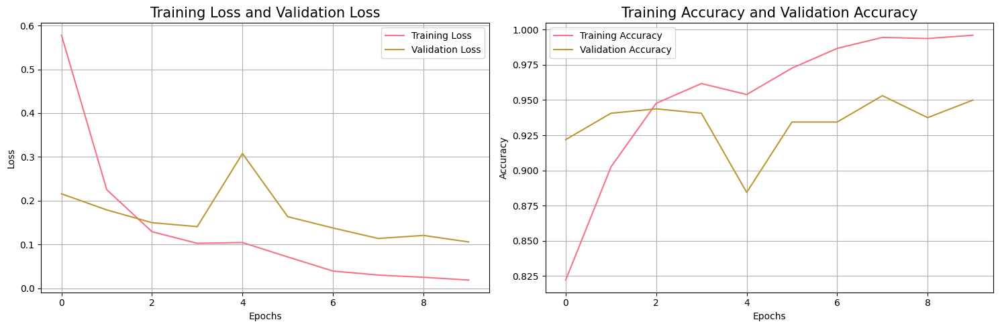

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Use a seaborn color palette
sns.set_palette("husl")

# Get the training history
history = updatedmodel.history

# Convert the training history to a DataFrame
history_df = pd.DataFrame(history)

# Plotting
plt.figure(figsize=(15, 5))

# Loss Plots
plt.subplot(1, 2, 1)
plt.plot(history_df["loss"], label="Training Loss")
plt.plot(history_df["val_loss"], label="Validation Loss")
plt.title('Training Loss and Validation Loss', fontsize=15)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

# Accuracy Plots
plt.subplot(1, 2, 2)
plt.plot(history_df["accuracy"], label="Training Accuracy")
plt.plot(history_df["val_accuracy"], label="Validation Accuracy")
plt.title('Training Accuracy and Validation Accuracy', fontsize=15)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
####################### Evalauting the model #############################

In [28]:
loss, accuracy=model.evaluate(val_data)
print(f"Accuracy:{accuracy}")
print(f"Loss:{loss}")

10/10 [==============================] - 39s 3s/step - loss: 0.1058 - accuracy: 0.9500
Accuracy:0.949999988079071
Loss:0.10579301416873932


In [ ]:
######################### Predictions ###################################

In [29]:
x_val=[]
y_val=[]


for image, label in val_data:
    x_val.extend(image.numpy())
    y_val.extend(label.numpy())  
    
predictions=model.predict(np.array(x_val))

y_pred=[int(np.round(prediction)) for prediction in predictions]

10/10 [==============================] - 32s 3s/step


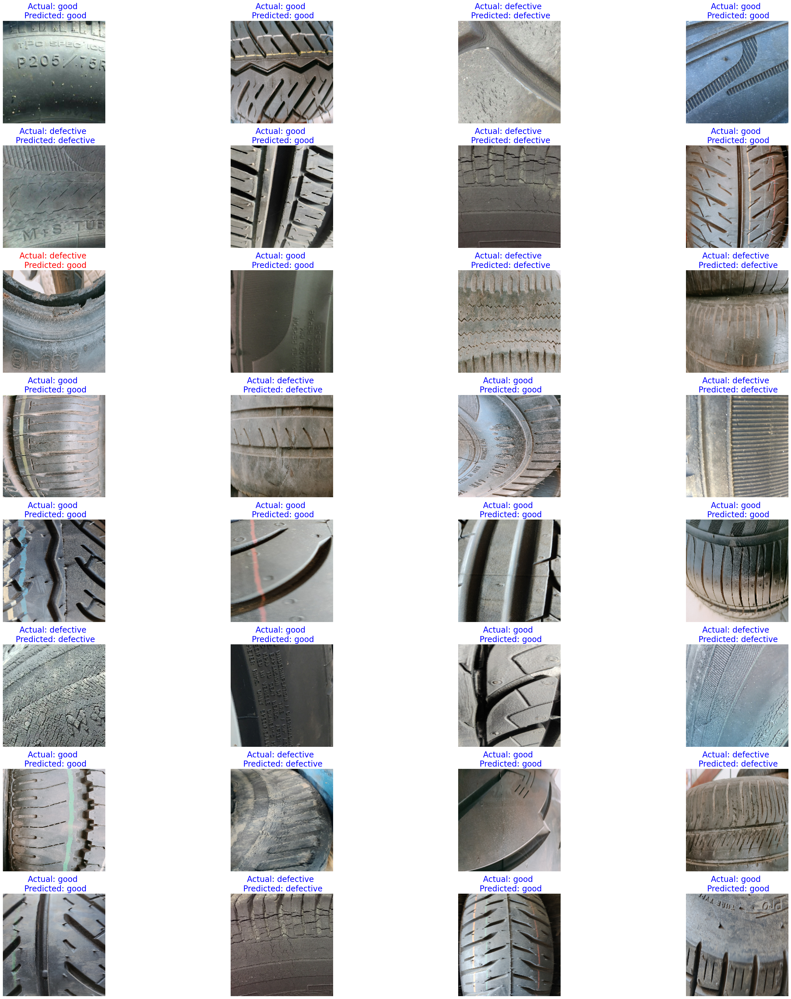

In [30]:
plt.figure(figsize=(35, 35),tight_layout=True, facecolor="white")


for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(x_val[i].astype("uint8"))
    actual_label = class_names[y_val[i]]
    predicted_label = class_names[y_pred[i]]
    
    # Check if the actual and predicted labels are the same
    if actual_label == predicted_label:
        label_color ='blue'
    else:
        label_color = 'red'
    
     
    plt.title(f'Actual: {actual_label} \n Predicted: {predicted_label}', color=label_color,fontsize=20)
    plt.axis("off")

plt.show()

In [39]:
# Displaying the classification report
print("Classification Report")
print("-----------------------")
print(classification_report(y_val, y_pred))

Classification Report
-----------------------
              precision    recall  f1-score   support

           0       0.97      0.93      0.95       158
           1       0.93      0.97      0.95       162

    accuracy                           0.95       320
   macro avg       0.95      0.95      0.95       320
weighted avg       0.95      0.95      0.95       320



F1-score: 0.9499511241446725
Overall Accuracy: 0.949999988079071
Recall: 0.9508145363408521
Precision: 0.9497577746522894


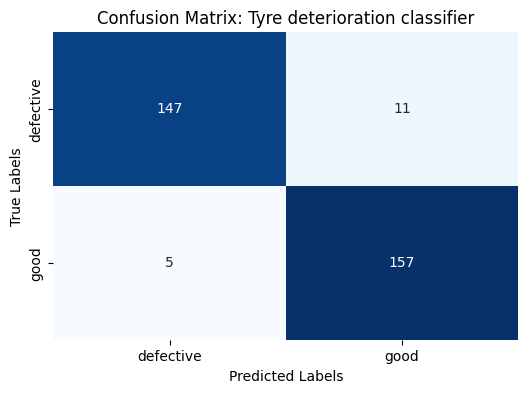

In [38]:
from sklearn.metrics import classification_report, confusion_matrix, f1_score, precision_score, recall_score
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import seaborn as sns

f1_scores = []
precision_scores = []
recall_scores = []

f1_scores.append(f1_score(y_pred, y_val, average="macro"))
precision_scores.append(precision_score(y_pred, y_val, average="macro"))
recall_scores.append(recall_score(y_pred, y_val, average="macro"))

# Print the evaluation scoring metrics
f1 = f1_scores[0]
precision = precision_scores[0]
recall = recall_scores[0]

print("F1-score:", f1)
print("Overall Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)

# Creating and visualising the confusion matrix
confusion = confusion_matrix(y_val, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix: Tyre deterioration classifier')
plt.show()

